# 💊 경구약제 이미지 객체 검출(Object Detection) 프로젝트

## Overview
이번 프로젝트의 목표는 사진 속에 있는 최대 4개의 알약의 이름(클래스)과 위치(바운딩 박스)를 검출하는 것입니다.

다양한 모델과 이미지 전처리 기법을 활용하여 모델 성능을 높여 나가 봅시다!

## Dataset
원본 데이터 출처: Ai Hub 경구약제 이미지 데이터 (원본 데이터를 가공 후 제공하였습니다.)
Ai Hub에 있는 데이터를 추가로 사용 가능하나, 다만 데이터셋별로 포함된 클래스 정보가 다를 수 있으니 확인하고 모델링을 진행해 주세요.
단, 아래 AI hub 내 두가지 데이터 셋은 사용을 금지합니다.
- Training > 라벨링데이터 > 경구약제조합 5000종 > TL_2_조합.zip
- Training > 원천데이터 > 경구약제조합 5000종 > TS_2_조합.zip
이미지는 PNG 형식, 주석은 COCO 포맷(JSON)으로 제공되며, 각 알약의 위치(Bonding Box)와 클래스 정보가 포함되어 있습니다.

## Files
- train_images - 훈련 데이터(이미지)
- train_annotations - 훈련 데이터(annotation)
- test_images - 테스트 데이터(이미지)

## 데이터 가공 관련 참고사항
- 원본 데이터에서는 모든 image_id, category_id, annotation_id 값이 1로 일괄 설정되어 있었으나, 이번에 제공되는 데이터는 보다 정확한 관리를 위해 아래와 같이 수정되었습니다.
    - image_id: 각 이미지의 파일명(file_name)을 기준으로 중복 없이 고유한 ID가 순차적으로 부여됩니다.
    - category_id: 각 JSON 파일 내 첫 번째 이미지에 포함된 dl_idx 값을 사용하여 정수형으로 할당됩니다.
    - annotation_id: 각 어노테이션에 대해 순차적으로 증가하는 고유 ID가 부여됩니다. 단, 어노테이션이 유효한 경우에만 적용됩니다. 여기서 "존재"와 "유효"의 기준은 다음과 같습니다:
        - 존재: 어노테이션 항목에 "bbox"라는 키가 실제로 있어야 하며, 값이 비어 있지 않아야 합니다. "bbox" 키가 없거나 비어 있으면 해당 어노테이션은 제외됩니다.
        - 유효: "bbox"의 값은 리스트 형태이며, 리스트의 길이가 정확히 4여야 합니다. 이는 [x, y, width, height] 형식을 의미하며, 이 조건을 만족해야 어노테이션에 ID가 부여됩니다.

In [ ]:
# @title Kaggle API Token 필요한 방식

import kagglehub

kagglehub.login()

path = kagglehub.competition_download('ai14-level-project')
print(path)  # 이게 실제 데이터가 저장된 경로

100%|██████████| 1.79G/1.79G [00:24<00:00, 80.1MB/s]

Extracting files...


/root/.cache/kagglehub/competitions/ai14-level-project


## 1. 폴더 구조 및 파일 확인

In [ ]:
# @title 폴더 구조, 파일 개수, JSON 스키마, 카테고리 정보까지 한꺼번에 출력

import os, json, glob
from collections import Counter

base = os.path.join(path, 'sprint_ai_project1_data')

print("="*60)
print("1. 전체 폴더 구조 (5단계 깊이)")
print("="*60)
for root, dirs, files_ in os.walk(base):
    level = root.replace(base, '').count(os.sep)
    if level < 5:
        indent = '  ' * level
        print(f"{indent}{os.path.basename(root)}/  (파일 {len(files_)}개, 폴더 {len(dirs)}개)")

print("\n" + "="*60)
print("2. 폴더별 파일 개수 및 확장자")
print("="*60)
for target in ['train_images', 'test_images', 'train_annotations']:
    target_path = os.path.join(base, target)
    if not os.path.exists(target_path):
        print(f"{target}: 경로 없음")
        continue
    all_files = glob.glob(os.path.join(target_path, '**', '*'), recursive=True)
    files_only = [f for f in all_files if os.path.isfile(f)]
    ext_count = Counter(os.path.splitext(f)[1] for f in files_only)
    print(f"\n[{target}] 총 {len(files_only)}개 파일")
    print("  확장자별:", dict(ext_count))
    print("  샘플 3개:", [os.path.basename(f) for f in files_only[:3]])

print("\n" + "="*60)
print("3. JSON 어노테이션 샘플 구조")
print("="*60)
json_files = glob.glob(os.path.join(base, 'train_annotations', '**', '*.json'), recursive=True)
print(f"JSON 파일 총 개수: {len(json_files)}\n")

if json_files:
    with open(json_files[0], 'r', encoding='utf-8') as f:
        sample = json.load(f)
    print("샘플 파일:", json_files[0])
    print("최상위 키:", list(sample.keys()))
    for key in sample.keys():
        val = sample[key]
        print(f"\n--- {key} ---")
        if isinstance(val, list):
            print(f"  리스트 길이: {len(val)}")
            print(f"  첫 항목: {val[0] if val else None}")
        else:
            print(f"  값: {val}")

print("\n" + "="*60)
print("4. 전체 JSON에서 category(dl_idx) 수집")
print("="*60)
all_categories = set()
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        d = json.load(f)
    for cat in d.get('categories', []):
        all_categories.add(cat.get('id') if 'id' in cat else str(cat))
print("전체 고유 category 수:", len(all_categories))

1. 전체 폴더 구조 (5단계 깊이)
sprint_ai_project1_data/  (파일 0개, 폴더 3개)
  test_images/  (파일 842개, 폴더 0개)
  train_images/  (파일 232개, 폴더 0개)
  train_annotations/  (파일 0개, 폴더 114개)
    K-003351-020014-022074_json/  (파일 0개, 폴더 3개)
      K-022074/  (파일 2개, 폴더 0개)
      K-003351/  (파일 2개, 폴더 0개)
      K-020014/  (파일 1개, 폴더 0개)
    K-003351-013900-022074_json/  (파일 0개, 폴더 3개)
      K-013900/  (파일 3개, 폴더 0개)
      K-022074/  (파일 3개, 폴더 0개)
      K-003351/  (파일 3개, 폴더 0개)
    K-003351-018147-036637_json/  (파일 0개, 폴더 3개)
      K-018147/  (파일 2개, 폴더 0개)
      K-036637/  (파일 2개, 폴더 0개)
      K-003351/  (파일 2개, 폴더 0개)
    K-003351-021325-033880_json/  (파일 0개, 폴더 3개)
      K-033880/  (파일 3개, 폴더 0개)
      K-021325/  (파일 3개, 폴더 0개)
      K-003351/  (파일 3개, 폴더 0개)
    K-003351-003832-020238_json/  (파일 0개, 폴더 3개)
      K-020238/  (파일 1개, 폴더 0개)
      K-003832/  (파일 1개, 폴더 0개)
      K-003351/  (파일 1개, 폴더 0개)
    K-003351-029667-031863_json/  (파일 0개, 폴더 3개)
      K-029667/  (파일 2개, 폴더 0개)
      K-003351/  (파일 2개, 폴

- 확인한 사항
    - train_images : 232장 (한 이미지에 약 2~4종류가 섞인 조합 이미지)
    - train_annotations : 763개 JSON (232장보다 훨씬 많음)
    - 이유:
        - 조합 이미지 1장당, 그 안에 들어있는 약 종류 수만큼 JSON이 따로 생성됨
        예: K-002483-003743-012778-013395 이미지(4종 조합)는 K-012778 폴더 등 4개 하위 폴더에 각각 JSON이 나뉘어 있고, 각 JSON은 **그 이미지 전체 크기(976×1280)** 는 동일하지만 bbox/category는 자기 담당 약 1개만 담고 있음
        즉, 실제 학습용 COCO 포맷을 만들려면 같은 file_name을 가진 여러 JSON의 annotation을 하나로 합쳐야 이미지당 여러 bbox가 있는 정상적인 detection 라벨이 완성됨

## 2. file_name 기준 JSON 그룹핑 & 병합

- 같은 이미지를 가리키는 여러 JSON의 annotation을 한 이미지의 다중 bbox로 통합
- 여러 JSON에 흩어진 **annotation(바운딩박스+클래스 정보)** 을 같은 이미지를 가리키는 것끼리 모아서 **이미지 1장 : bbox 여러 개** 구조로 재구성

In [ ]:
import json, glob, os
from collections import defaultdict

base = os.path.join(path, 'sprint_ai_project1_data')
json_files = glob.glob(os.path.join(base, 'train_annotations', '**', '*.json'), recursive=True)

# file_name 기준으로 annotation, category, image 정보를 모으는 그릇
merged_by_filename = defaultdict(lambda: {'image_info': None, 'annotations': [], 'categories': {}})

for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        d = json.load(f)

    img_info = d['images'][0]
    fname = img_info['file_name']

    entry = merged_by_filename[fname]
    if entry['image_info'] is None:
        # 이미지 메타정보(width, height 등)는 한 번만 저장
        entry['image_info'] = img_info

    entry['annotations'].extend(d['annotations'])  # bbox들을 계속 누적

    for cat in d['categories']:
        entry['categories'][cat['id']] = cat  # category_id 기준 중복 제거

print("병합 후 고유 이미지 수:", len(merged_by_filename))

병합 후 고유 이미지 수: 232


In [ ]:
# @title 검증 (232장과 일치하는지 확인)

train_img_names = set(os.path.basename(f) for f in glob.glob(os.path.join(base, 'train_images', '*.png')))
merged_names = set(merged_by_filename.keys())

print("train_images 폴더:", len(train_img_names))
print("병합된 이미지 수:", len(merged_names))
print("이미지엔 있는데 JSON이 없는 경우:", train_img_names - merged_names)
print("JSON엔 있는데 이미지가 없는 경우:", merged_names - train_img_names)

train_images 폴더: 232
병합된 이미지 수: 232
이미지엔 있는데 JSON이 없는 경우: set()
JSON엔 있는데 이미지가 없는 경우: set()


In [ ]:
# @title 하나의 COCO 포맷으로 최종 생성

final_images, final_annotations, final_categories = [], [], {}

for new_img_id, (fname, entry) in enumerate(merged_by_filename.items(), start=1):
    img_info = dict(entry['image_info'])
    img_info['id'] = new_img_id  # image_id 재부여 (안내된 규칙)
    final_images.append(img_info)

    for ann in entry['annotations']:
        ann = dict(ann)
        ann['image_id'] = new_img_id
        final_annotations.append(ann)  # annotation_id는 다음 단계(유효성 필터링) 후 부여

    final_categories.update(entry['categories'])

print("최종 이미지 수:", len(final_images))
print("최종 annotation 수 (필터링 전):", len(final_annotations))
print("최종 category 수:", len(final_categories))

최종 이미지 수: 232
최종 annotation 수 (필터링 전): 763
최종 category 수: 56


- 두 집합 모두 비어있으니(set()), 232장 이미지와 763개 JSON이 완벽하게 매칭됐다는 뜻. 누락이나 불일치 없음.
- 이미지 232장, annotation 763개 → 평균적으로 이미지 1장당 약 3.3개의 bbox(약 조합 수)가 있다는 뜻이고, 앞서 확인한 "2~4종 조합"과도 일치함
- category 56개 → 클래스 수도 유지됨

## 3. bbox 존재/유효성 필터링 (bbox 키 존재 + 길이 4 확인, 원본 오류 걸러내기)

안내된 기준을 그대로 적용
- 존재(existence) : annotation에 "bbox" 키가 있고, 값이 비어있지 않아야 함
- 유효(validity) : bbox가 리스트이고 길이가 정확히 4([x, y, width, height])여야 함

이 조건을 만족 못하는 annotation은 제외하고 annotation_id를 순차 부여

문제
- 병합 후 763개를 하나의 리스트로 합침	여러 annotation이 같은 id 값을 가지는 중복(duplicate) 발생 그래서 병합 직후, 전체를 기준으로 1, 2, 3, ... 763처럼 순차적으로 다시 번호를 매겨 중복 없이 만듬. image_id도 같은 이유로 재부여

In [ ]:
valid_annotations = []
invalid_annotations = []  # 나중에 확인용으로 따로 보관

for ann in final_annotations:
    bbox = ann.get('bbox', None)

    # 존재 조건: 키가 있고, 비어있지 않아야 함
    exists = bbox is not None and bbox != []

    # 유효 조건: 리스트이고 길이가 정확히 4
    is_valid = exists and isinstance(bbox, list) and len(bbox) == 4

    if is_valid:
        valid_annotations.append(ann)
    else:
        invalid_annotations.append(ann)

print("전체 annotation 수:", len(final_annotations))
print("유효한 annotation 수:", len(valid_annotations))
print("제외된(무효) annotation 수:", len(invalid_annotations))

전체 annotation 수: 763
유효한 annotation 수: 763
제외된(무효) annotation 수: 0


In [ ]:
# @title annotation_id 재부여 (유효한 것만 대상으로)

for new_ann_id, ann in enumerate(valid_annotations, start=1):
    ann['id'] = new_ann_id  # annotation_id 재부여

print("최종 annotation 수:", len(valid_annotations))
print("샘플:", valid_annotations[0])

최종 annotation 수: 763
샘플: {'area': 34040, 'iscrowd': 0, 'bbox': [627, 823, 184, 185], 'category_id': 22074, 'ignore': 0, 'segmentation': [], 'id': 1, 'image_id': 1}


In [ ]:
# @title 무효 annotation이 있었다면 원인 확인용
# if invalid_annotations:
#     print("무효 annotation 샘플 (최대 5개):")
#     for ann in invalid_annotations[:5]:
#         print(ann)

## 4. image_id / category_id / annotation_id 재부여

위에서 다 진행 했음

In [ ]:
# @title 실제로 전체 데이터에서 category_id와 dl_idx가 항상 일치하는지 검증

correct_mismatch = []

for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        d = json.load(f)
    dl_idx = int(d['images'][0]['dl_idx'])
    for ann in d['annotations']:
        if ann['category_id'] != dl_idx:
            correct_mismatch.append({
                'file': jf,
                'dl_idx': dl_idx,
                'category_id': ann['category_id']
            })

print("실제 불일치 건수:", len(correct_mismatch))
if correct_mismatch:
    print(correct_mismatch[:5])

실제 불일치 건수: 0


## 5. 클래스(category) 분포 확인

- 현재 확인된 56개 클래스(dl_idx)별 이미지 수·객체 수 불균형 파악
- 클래스 분포 확인이란, 56개 약 종류(category_id) 각각이 데이터셋에 몇 번씩 등장하는지 세어보는 작업.
- 객체 검출 모델은 학습 데이터에 적게 등장하는 클래스를 잘 못 맞추는 경향(class imbalance 문제)이 있음. 미리 분포를 알아야 나중에 샘플링/증강 전략을 세울 수 있음

In [ ]:
from collections import Counter
import pandas as pd

# category_id별 등장 횟수 (annotation 기준 = bbox 개수 기준)
cat_counts = Counter(ann['category_id'] for ann in valid_annotations)

# category_id -> dl_name 매핑 (사람이 읽을 수 있게)
cat_id_to_name = {cat['id']: cat['name'] for cat in final_categories.values()}

df = pd.DataFrame([
    {'category_id': cid, 'name': cat_id_to_name.get(cid, '알수없음'), 'count': cnt}
    for cid, cnt in cat_counts.items()
]).sort_values('count', ascending=False).reset_index(drop=True)

print("전체 클래스 수:", len(df))
print("\n[상위 5개]")
print(df.head())
print("\n[하위 5개]")
print(df.tail())
print("\n[통계 요약]")
print(df['count'].describe())

전체 클래스 수: 56

[상위 5개]
   category_id                name  count
0         3351         일양하이트린정 2mg    153
1         3483  기넥신에프정(은행엽엑스)(수출용)     45
2        35206        아토젯정 10/40mg     37
3        16262          크레스토정 20mg     23
4        21325          아토르바정 10mg     22

[하위 5개]
    category_id               name  count
51        21771         라비에트정 20mg      3
52        27926          울트라셋이알서방정      3
53        33208        에스원엠프정 20mg      3
54        16551      동아가바펜틴정 800mg      3
55        34597  제미메트서방정 50/1000mg      3

[통계 요약]
count     56.000000
mean      13.625000
std       20.823555
min        3.000000
25%        3.000000
50%        9.000000
75%       16.000000
max      153.000000
Name: count, dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

!apt-get -qq install fonts-nanum > /dev/null
import matplotlib.font_manager as fm

fm.fontManager.addfont('/usr/share/fonts/truetype/nanum/NanumGothic.ttf')
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐도 같이 방지

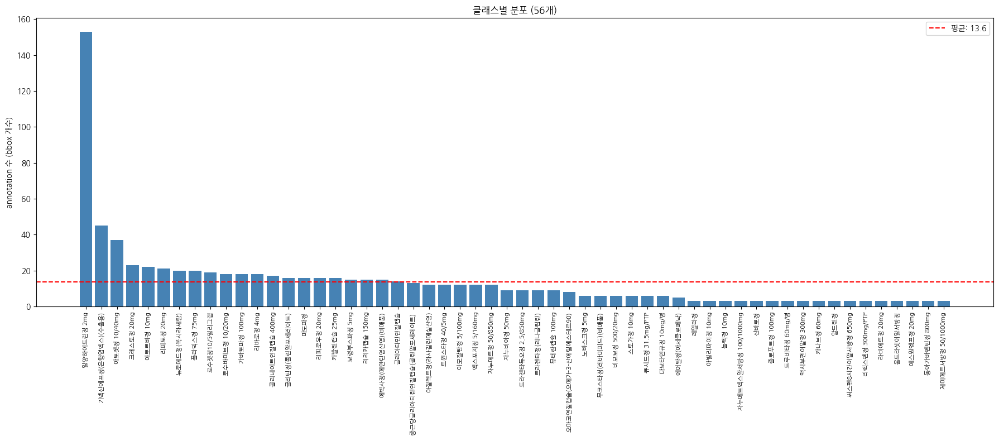

In [ ]:
df_sorted = df.sort_values('count', ascending=False)

plt.figure(figsize=(18, 8))
plt.bar(df_sorted['name'], df_sorted['count'], color='steelblue')
plt.xticks(rotation=90, fontsize=8)
plt.ylabel('annotation 수 (bbox 개수)')
plt.title('클래스별 분포 (56개)')
plt.axhline(y=df_sorted['count'].mean(), color='red', linestyle='--', label=f"평균: {df_sorted['count'].mean():.1f}")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# @title count 값별로 몇 개 클래스가 있는지 분포 확인
count_distribution = df['count'].value_counts().sort_index()
print("count값 : 해당 count를 가진 클래스 개수")
print(count_distribution)

print("\n정확히 3인 클래스 수:", (df['count'] == 3).sum())
print("3 이하인 클래스 수:", (df['count'] <= 3).sum())
print("5 이하인 클래스 수:", (df['count'] <= 5).sum())
print("10 이하인 클래스 수:", (df['count'] <= 10).sum())

count값 : 해당 count를 가진 클래스 개수
count
3      17
5       1
6       6
8       1
9       4
12      5
13      1
14      1
15      3
16      4
17      1
18      3
19      1
20      2
21      1
22      1
23      1
37      1
45      1
153     1
Name: count, dtype: int64

정확히 3인 클래스 수: 17
3 이하인 클래스 수: 17
5 이하인 클래스 수: 18
10 이하인 클래스 수: 29


In [ ]:
# @title annotation 기준(bbox 수)과 다르게, "몇 장의 이미지에 나타나는지"도 중요
img_counts = Counter()
for fname, entry in merged_by_filename.items():
    for cid in set(ann['category_id'] for ann in entry['annotations']):
        img_counts[cid] += 1

df['num_images'] = df['category_id'].map(img_counts)
print(df.head(10))
print(df.tail(10))

   category_id                name  count  num_images
0         3351         일양하이트린정 2mg    153         153
1         3483  기넥신에프정(은행엽엑스)(수출용)     45          45
2        35206        아토젯정 10/40mg     37          37
3        16262          크레스토정 20mg     23          23
4        21325          아토르바정 10mg     22          22
5        16232           리피토정 20mg     21          21
6         3832        뉴로메드정(옥시라세탐)     20          20
7        20238          플라빅스정 75mg     20          20
8        36637        로수젯정10/5밀리그램     19          19
9        38162      로수바미브정 10/20mg     18          18
    category_id               name  count  num_images
46        22362      맥시부펜이알정 300mg      3           3
47        27777          카나브정 60mg      3           3
48         3743               알드린정      3           3
49        13395  써스펜8시간이알서방정 650mg      3           3
50        12081    리렉스펜정 300mg/PTP      3           3
51        21771         라비에트정 20mg      3           3
52        27926          울트라

In [ ]:
diff = df[df['count'] != df['num_images']]
print("annotation 수와 이미지 수가 다른 클래스:", len(diff))
print(diff)

annotation 수와 이미지 수가 다른 클래스: 0
Empty DataFrame
Columns: [category_id, name, count, num_images]
Index: []


- count와 num_images가 완전히 동일합니다(56개 클래스 전부 일치, 차이 0건). 즉 한 이미지 안에 같은 클래스가 중복 등장하는 경우는 없다는 뜻
- 같은 약이 2번 겹쳐 나오는 경우는 없고, 항상 서로 다른 약끼리만 조합됐음

## 6. 조합 종류별 분포 (2종/3종/4종 조합)
- 파일명 패턴(K-xxx-xxx-xxx) 기준으로 한 이미지에 약이 몇 개 섞였는지 분포 확인 → 객체 수 불균형과 직결
- 조합 종류(2종/3종/4종)별로 이미지가 몇 장씩 있는지 알아야, split이나 증강 전략에서 편향이 생기지 않는지 확인할 수 있음.

In [ ]:
from collections import Counter

# 이미지(파일명)별 annotation(bbox) 개수 세기
num_objects_per_image = Counter(len(entry['annotations']) for entry in merged_by_filename.values())

print("이미지당 객체 수 분포:")
for num_obj, num_img in sorted(num_objects_per_image.items()):
    print(f"  {num_obj}개 객체: {num_img}장")

이미지당 객체 수 분포:
  2개 객체: 7장
  3개 객체: 151장
  4개 객체: 74장


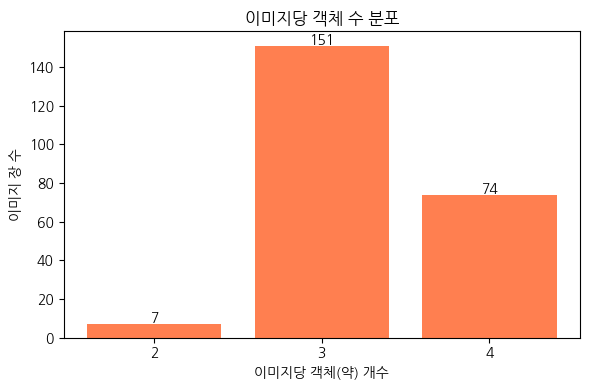

In [ ]:
import matplotlib.pyplot as plt

x = sorted(num_objects_per_image.keys())
y = [num_objects_per_image[k] for k in x]

plt.figure(figsize=(6, 4))
plt.bar(x, y, color='coral')
plt.xlabel('이미지당 객체(약) 개수')
plt.ylabel('이미지 장 수')
plt.title('이미지당 객체 수 분포')
plt.xticks(x)
for i, v in enumerate(y):
    plt.text(x[i], v + 1, str(v), ha='center')
plt.tight_layout()
plt.show()

## 7. bbox 크기/비율 분포 (이상치 탐지)
- bbox 이상치 : 좌표나 크기가 상식적으로 말이 안 되는 경우를 말함. bbox가 이미지 밖으로 나가거나 너비/높이가 0이거나, 이미지 전체를 다 덮을 만큼 비정상적으로 크거나 작은 경우.
- width/height 976×1280 대비 bbox가 비정상적으로 크거나 작은 경우(오류) 탐지
- 이런 오류가 그대로 학습에 들어가면 모델이 잘못된 위치를 정답으로 배우게 되어 성능이 떨어짐. 안내문의 "크고 작은 오류들이 포함되어있다"가 이상치를 말하는 것 같음

In [ ]:
import pandas as pd

issues = []

for fname, entry in merged_by_filename.items():
    img_w = entry['image_info']['width']
    img_h = entry['image_info']['height']

    for ann in entry['annotations']:
        x, y, w, h = ann['bbox']
        problems = []

        # 1. 너비/높이가 0 이하
        if w <= 0 or h <= 0:
            problems.append('width_or_height_zero_or_negative')

        # 2. bbox가 이미지 범위를 벗어남
        if x < 0 or y < 0 or (x + w) > img_w or (y + h) > img_h:
            problems.append('out_of_image_bounds')

        # 3. bbox가 이미지 면적 대비 너무 작음 (0.1% 미만) - 노이즈성 박스 의심
        bbox_area_ratio = (w * h) / (img_w * img_h)
        if bbox_area_ratio < 0.001:
            problems.append('too_small')

        # 4. bbox가 이미지 면적 대비 너무 큼 (90% 초과) - 약이 아니라 배경 전체를 감쌌을 가능성
        if bbox_area_ratio > 0.9:
            problems.append('too_large')

        # 5. area 필드(객체가 실제로 차지하는 면적)와 실제 w*h가 일치하는지 (COCO 규칙상 area는 보통 w*h)
        bbox_pixel_area = w * h
        if bbox_pixel_area > 0:
            relative_diff = abs(ann['area'] - bbox_pixel_area) / bbox_pixel_area
            if relative_diff > 0.05:
                problems.append('area_mismatch')

        if problems:
            issues.append({
                'file_name': fname,
                'category_id': ann['category_id'],
                'bbox': ann['bbox'],
                'img_size': (img_w, img_h),
                'area_field': ann['area'],
                'bbox_area_ratio': round(bbox_area_ratio, 4),
                'problems': problems
            })

df_issues = pd.DataFrame(issues)
print("이상치 발견 건수:", len(df_issues))
if len(df_issues) > 0:
    print(df_issues['problems'].explode().value_counts())
    print("\n샘플:")
    print(df_issues.head(10))

이상치 발견 건수: 3
problems
area_mismatch          2
out_of_image_bounds    1
Name: count, dtype: int64

샘플:
                                       file_name  category_id  \
0  K-003351-021325-033880_0_2_0_2_70_000_200.png         3351   
1  K-003351-019232-029667_0_2_1_2_70_000_200.png        19232   
2  K-003351-016262-018357_0_2_0_2_75_000_200.png        18357   

                    bbox     img_size  area_field  bbox_area_ratio  \
0   [427, 839, 189, 182]  (976, 1280)       36288           0.0275   
1   [523, 201, 232, 241]  (976, 1280)       79112           0.0448   
2  [6567, 625, 311, 315]  (976, 1280)       97965           0.0784   

                problems  
0        [area_mismatch]  
1        [area_mismatch]  
2  [out_of_image_bounds]  


In [ ]:
# @title out_of_image_bounds 1 제거
# 더 안전한 방식: image_id로 실제 이미지 크기를 찾아서 검증
image_size_by_id = {img['id']: (img['width'], img['height']) for img in final_images}

before_count = len(valid_annotations)

valid_annotations = [
    ann for ann in valid_annotations
    if (lambda w_img, h_img, x, y, w, h:
        x >= 0 and y >= 0 and (x + w) <= w_img and (y + h) <= h_img
    )(*image_size_by_id[ann['image_id']], *ann['bbox'])
]

after_count = len(valid_annotations)
print(f"제거 전: {before_count}개")
print(f"제거 후: {after_count}개")

제거 전: 763개
제거 후: 762개


In [ ]:
for new_ann_id, ann in enumerate(valid_annotations, start=1):
    ann['id'] = new_ann_id

print("최종 annotation 수:", len(valid_annotations))

최종 annotation 수: 762


In [ ]:
# 삭제된 annotation이 속한 이미지에 다른 annotation이 남아있는지 확인
# target_fname = 'K-003351-016262-018357_0_2_0_2_75_000_200.png'  # out_of_image_bounds였던 파일

# remaining_anns_for_image = [
#     ann for ann in valid_annotations
#     if final_images[ann['image_id'] - 1]['file_name'] == target_fname
# ]
# print(f"{target_fname}에 남은 annotation 수:", len(remaining_anns_for_image))

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

def visualize_image(file_name, ax=None):
    img_path = os.path.join(base, 'train_images', file_name)
    img = Image.open(img_path)

    img_id = next(im['id'] for im in final_images if im['file_name'] == file_name)
    anns = [ann for ann in valid_annotations if ann['image_id'] == img_id]

    cat_name_by_id = {cat['id']: cat['name'] for cat in final_categories.values()}

    if ax is None:
        fig, ax = plt.subplots(1, figsize=(8, 10))
    ax.imshow(img)

    colors = ['red', 'blue', 'green', 'orange']
    for i, ann in enumerate(anns):
        x, y, w, h = ann['bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=colors[i % 4], facecolor='none')
        ax.add_patch(rect)
        label = cat_name_by_id.get(ann['category_id'], str(ann['category_id']))
        ax.text(x, y - 10, label, color=colors[i % 4], fontsize=9, weight='bold')

    ax.set_title(file_name, fontsize=8)
    ax.axis('off')

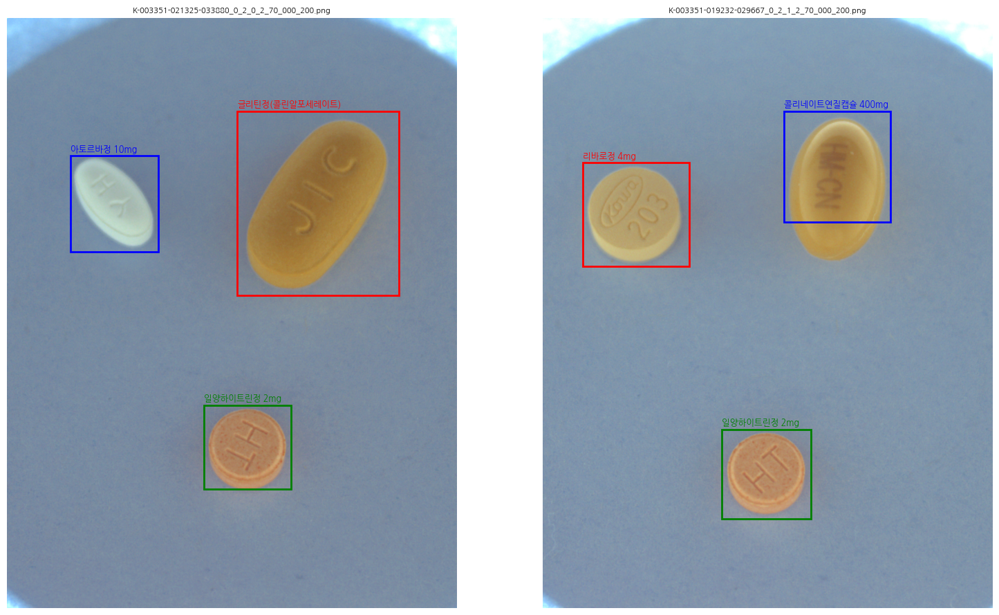

In [ ]:
# area_mismatch 2건 시각화
mismatch_files = df_issues[df_issues['problems'].apply(lambda p: 'area_mismatch' in p)]['file_name'].tolist()

fig, axes = plt.subplots(1, len(mismatch_files), figsize=(8 * len(mismatch_files), 9))
if len(mismatch_files) == 1:
    axes = [axes]

for ax, fname in zip(axes, mismatch_files):
    visualize_image(fname, ax)

plt.tight_layout()
plt.show()

- 2건 모두 정상 데이터이며, 오류가 아님. area 필드와 bbox 면적의 차이는 알약의 실제 모양(원형/타원형)이 사각형 bbox와 다르기 때문에 생기는 자연스러운 현상

## 8. 샘플 이미지 + 병합된 bbox 시각화
- 병합이 제대로 됐는지, 여러 약의 bbox가 겹치거나 어긋나지 않는지 눈으로 검증 (가장 중요한 QA 단계)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

def visualize_image(file_name, ax=None):
    img_path = os.path.join(base, 'train_images', file_name)
    img = Image.open(img_path)

    img_id = next(im['id'] for im in final_images if im['file_name'] == file_name)
    anns = [ann for ann in valid_annotations if ann['image_id'] == img_id]

    cat_name_by_id = {cat['id']: cat['name'] for cat in final_categories.values()}

    if ax is None:
        fig, ax = plt.subplots(1, figsize=(8, 10))
    ax.imshow(img)

    colors = ['red', 'blue', 'green', 'orange']
    for i, ann in enumerate(anns):
        x, y, w, h = ann['bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=colors[i % 4], facecolor='none')
        ax.add_patch(rect)
        label = cat_name_by_id.get(ann['category_id'], str(ann['category_id']))
        ax.text(x, y - 10, label, color=colors[i % 4], fontsize=9, weight='bold')

    ax.set_title(file_name, fontsize=8)
    ax.axis('off')

# 일반 샘플 4장 랜덤 확인
import random
sample_files = random.sample(list(merged_by_filename.keys()), 4)

fig, axes = plt.subplots(1, 4, figsize=(24, 8))
for ax, fname in zip(axes, sample_files):
    visualize_image(fname, ax)
plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

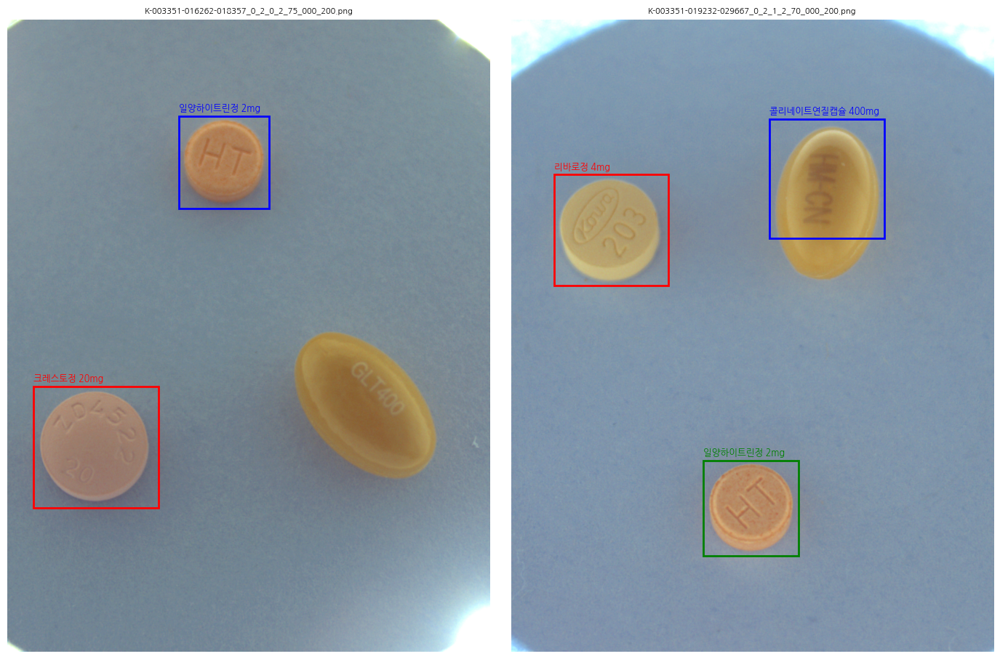

In [ ]:
# @title 의심 사례 2건 직접 확인
suspect_files = [
    'K-003351-016262-018357_0_2_0_2_75_000_200.png',  # out_of_image_bounds 제거된 이미지 (남은 2개 정상인지 확인)
    'K-003351-019232-029667_0_2_1_2_70_000_200.png',  # area_mismatch 41.5%
]

fig, axes = plt.subplots(1, 2, figsize=(14, 9))
for ax, fname in zip(axes, suspect_files):
    visualize_image(fname, ax)
plt.tight_layout()
plt.show()

왼쪽 이미지
- [6567, 625, 311, 315]에서 6567이 오타로 보임
- out_of_image_bounds 1 제거 했으므로 박스가 보이지 않음.
- 학습에서 제외시키기 보다는 1건 정도는 미미한 영향이라고 판한하고 넘어가기로 함

오른쪽 이미지
- 위에서 확인 함

## 9. test_images 특성 확인

- annotation이 없으므로 이미지 해상도/파일명 패턴만이라도 train과 비교 (예: test는 숫자 파일명 528.png처럼 단순 → 조합 여부를 파일명으로 알 수 없음, 주의 필요)
- test_images는 annotation이 없으므로, 이미지 자체의 특성(파일명, 해상도, 개수 등)만으로 train과 비교. 이미 확인했듯 test 파일명은 528.png처럼 단순 숫자라 train과 명명 규칙이 다름

- train과 test의 이미지 크기가 다르면 리사이즈/전처리 파이프라인에서 별도 처리가 필요함.
"test에는 train에 없는 클래스가 존재한다"고 명시되어 있으므로, 최소한 이미지 특성 차원에서라도 train과 얼마나 다른 환경(배경, 해상도, 조합 여부)인지 파악이 필요함

In [ ]:
from PIL import Image
from collections import Counter

test_img_dir = os.path.join(base, 'test_images')
test_files = sorted(glob.glob(os.path.join(test_img_dir, '*.png')))

print("test 이미지 개수:", len(test_files))

# 해상도 분포 확인 (전수조사는 느릴 수 있어 일단 전체 확인)
resolutions = Counter()
for f in test_files:
    with Image.open(f) as img:
        resolutions[img.size] = resolutions.get(img.size, 0) + 1

print("\ntest 해상도 분포:")
for res, cnt in resolutions.most_common():
    print(f"  {res}: {cnt}장")

test 이미지 개수: 842

test 해상도 분포:
  (976, 1280): 842장


In [ ]:
# @title train 해상도 분포도 같이 확인 (비교용)
train_resolutions = Counter()
for entry in merged_by_filename.values():
    w, h = entry['image_info']['width'], entry['image_info']['height']
    train_resolutions[(w, h)] += 1

print("train 해상도 분포:")
for res, cnt in train_resolutions.most_common():
    print(f"  {res}: {cnt}장")

train 해상도 분포:
  (976, 1280): 232장


In [ ]:
# @title 파일명 패턴 비교
print("test 파일명 샘플:", [os.path.basename(f) for f in test_files[:5]])
print("train 파일명 샘플:", list(merged_by_filename.keys())[:2])

# test 파일명이 전부 순수 숫자인지 확인
import re
non_numeric = [os.path.basename(f) for f in test_files if not re.match(r'^\d+\.png$', os.path.basename(f))]
print("\n숫자가 아닌 test 파일명 개수:", len(non_numeric))
if non_numeric:
    print(non_numeric[:10])

test 파일명 샘플: ['1.png', '10.png', '100.png', '1003.png', '1004.png']
train 파일명 샘플: ['K-003351-020014-022074_0_2_0_2_90_000_200.png', 'K-003351-020014-022074_0_2_0_2_70_000_200.png']

숫자가 아닌 test 파일명 개수: 0


1. 해상도 통일 → 별도 리사이즈 로직 불필요, 전처리 단순화 가능
2. 파일명으로 정답 유추 불가 → train은 파일명만 봐도 어떤 약이 몇 종 들어있는지 알 수 있었지만, test는 순수 익명 번호라 모델이 이미지만 보고 판단해야 함 (당연한 대회 설계지만, 혹시라도 파일명을 feature로 쓰려는 시도가 있었다면 불가능하다는 걸 미리 확인한 셈)
3. test 이미지 1장당 객체 수(몇개 일지)는 미지수 → train은 2~4개였지만, test는 안내문대로 "train에 없는 클래스도 존재"하고 조합 수도 다를 수 있어 예측 시 다양한 개수의 객체를 탐지할 수 있는 모델이어야 함

## 10. train/val split 전략

- 클래스 불균형(56종) 고려한 stratified split

- 이미지 하나에 클래스가 여러 개(2~4개) 달려있는 다중 라벨(multi-label) 구조라, 일반적인 sklearn train_test_split의 stratify(단일 라벨 기준)는 그대로 쓸 수 없음. 게다가 최소 3장뿐인 클래스가 14개나 있어서, 단순 랜덤 분할하면 그 클래스들이 val에 아예 안 들어가거나 train에 아예 안 들어갈 위험이 큼.

- 왜 iterative stratification이 필요한가 : "모든 클래스가 train과 val 양쪽에 최소 1개 이상 들어가도록" 분배해주는 알고리즘이 iterative stratification 임. 다중 라벨 데이터 분할에 특화된 방법.

In [ ]:
!pip install iterative-stratification -q

In [ ]:
import numpy as np
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit

# 이미지 X 클래스의 multi-hot 매트릭스 생성
image_names = list(merged_by_filename.keys())
all_cat_ids = sorted(cat_id_to_name.keys())
cat_id_to_idx = {cid: i for i, cid in enumerate(all_cat_ids)}

Y = np.zeros((len(image_names), len(all_cat_ids)), dtype=int)
for i, fname in enumerate(image_names):
    for ann in merged_by_filename[fname]['annotations']:
        Y[i, cat_id_to_idx[ann['category_id']]] = 1

X = np.array(image_names).reshape(-1, 1)  # 형식만 맞추기용

msss = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, val_idx = next(msss.split(X, Y))

train_files = [image_names[i] for i in train_idx]
val_files = [image_names[i] for i in val_idx]

print("train:", len(train_files), "장")
print("val:", len(val_files), "장")

train: 184 장
val: 48 장


In [ ]:
train_classes = set()
for fname in train_files:
    for ann in merged_by_filename[fname]['annotations']:
        train_classes.add(ann['category_id'])

val_classes = set()
for fname in val_files:
    for ann in merged_by_filename[fname]['annotations']:
        val_classes.add(ann['category_id'])

print("train에만 있고 val엔 없는 클래스:", set(all_cat_ids) - train_classes - (set(all_cat_ids) - val_classes))
missing_in_val = set(all_cat_ids) - val_classes
missing_in_train = set(all_cat_ids) - train_classes
print("val에 없는 클래스:", missing_in_val)
print("train에 없는 클래스:", missing_in_train)

train에만 있고 val엔 없는 클래스: set()
val에 없는 클래스: {12081, 24850, 33009}
train에 없는 클래스: set()


train에 없는 클래스는 0건이지만, val에 4개 클래스(12081, 24850, 33009, 25367)가 빠져있음. train은 문제없지만, val 기준으로 이 4개 클래스의 성능은 검증할 수 없는 상태.

원인
- 위에서 확인했듯 이 클래스들은 대부분 **3장(최소값)** 짜리 클래스입니다. 3장을 80:20으로 나누면 산술적으로 0.6장이 되어, 알고리즘이 반올림하면서 0장 또는 1장으로 쏠리기 쉬움. 표본이 너무 적어서 완벽한 분할이 어려운 한계

방법
- 소 표본 클래스는 강제로 val에 최소 1장 배정
3장뿐인 클래스들만 먼저 수동으로 1장씩 val에 배정하고, 나머지를 stratified split으로 채우는 방식.

In [ ]:
from collections import defaultdict

rare_classes = {12081, 24850, 33009, 25367}

# 희귀 클래스별로 어떤 이미지들이 포함하는지 매핑
images_by_rare_class = defaultdict(list)
for fname in image_names:
    cats = set(ann['category_id'] for ann in merged_by_filename[fname]['annotations'])
    for c in cats & rare_classes:
        images_by_rare_class[c].append(fname)

# 각 희귀 클래스마다: 1장은 val행, 나머지는 train행으로 강제 배정
forced_val = set()
forced_train = set()

for cat, files in images_by_rare_class.items():
    forced_val.add(files[0])          # 1장만 val로
    forced_train.update(files[1:])    # 나머지는 train으로

print("강제 val:", forced_val)
print("강제 train:", forced_train)

강제 val: {'K-003483-025367-027733-035206_0_2_0_2_75_000_200.png', 'K-002483-012081-012778-025438_0_2_0_2_90_000_200.png', 'K-001900-016548-019607-033009_0_2_0_2_90_000_200.png', 'K-001900-016548-024850-029345_0_2_0_2_90_000_200.png'}
강제 train: {'K-003483-025367-027733-035206_0_2_0_2_90_000_200.png', 'K-003483-020877-025367-035206_0_2_0_2_75_000_200.png', 'K-003483-025367-025469-035206_0_2_0_2_90_000_200.png', 'K-003483-025367-025469-035206_0_2_0_2_75_000_200.png', 'K-003483-025367-027733-029667_0_2_0_2_70_000_200.png', 'K-001900-016548-024850-029345_0_2_0_2_75_000_200.png', 'K-001900-016548-019607-033009_0_2_0_2_70_000_200.png', 'K-001900-016548-019607-033009_0_2_0_2_75_000_200.png', 'K-003483-020877-025367-035206_0_2_0_2_90_000_200.png', 'K-003483-020877-025367-035206_0_2_0_2_70_000_200.png', 'K-003483-025367-027733-029667_0_2_0_2_90_000_200.png', 'K-003483-025367-025469-035206_0_2_0_2_70_000_200.png', 'K-001900-016548-024850-029345_0_2_0_2_70_000_200.png', 'K-003483-025367-027733-0296

In [ ]:
# 나머지 이미지로 stratified split 수행 (강제 배정된 것들은 제외하고)
already_assigned = forced_val | forced_train
remaining_files = [f for f in image_names if f not in already_assigned]

Y_remaining = np.array([Y[image_names.index(f)] for f in remaining_files])
X_remaining = np.array(remaining_files).reshape(-1, 1)

msss2 = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx2, val_idx2 = next(msss2.split(X_remaining, Y_remaining))

train_files = [remaining_files[i] for i in train_idx2] + list(forced_train)
val_files = [remaining_files[i] for i in val_idx2] + list(forced_val)

print("최종 train:", len(train_files), "장")
print("최종 val:", len(val_files), "장")

최종 train: 182 장
최종 val: 50 장


In [ ]:
# 양쪽 다 재검증
train_classes = set(ann['category_id'] for f in train_files for ann in merged_by_filename[f]['annotations'])
val_classes = set(ann['category_id'] for f in val_files for ann in merged_by_filename[f]['annotations'])

print("train에 없는 클래스:", set(all_cat_ids) - train_classes)
print("val에 없는 클래스:", set(all_cat_ids) - val_classes)

train에 없는 클래스: set()
val에 없는 클래스: set()


In [ ]:
print("train 이미지 수:", len(train_files))
print("val 이미지 수:", len(val_files))
print("비율:", round(len(val_files) / (len(train_files) + len(val_files)) * 100, 1), "%")

train 이미지 수: 182
val 이미지 수: 50
비율: 21.6 %


## 더 생각해 볼 부분

- 이미지 색상, 밝기, 선명도 확인 필요
- 클래스 불균형은 어떻게 처리하면 좋을까?
    - 오버샘플링
    - 클래스별 증강 배수 차등 적용


## 11. 이미지 밝기/색상 분포 확인

- 배경·조명 조건이 얼마나 통제되어 있는지 파악하고, 색상 보정 필요성 판단
- annotation에 이미 back_color(배경색), light_color(조명색) 메타데이터가 있음. 이 범주형 정보로 얼마나 다양한 조건이 섞여있는지 보고, 실제 픽셀 값(밝기)까지 정량적으로 확인하면 보정이 필요한지 판단할 수 있을것으로 보임.

In [ ]:
from collections import Counter

back_colors = Counter()
light_colors = Counter()

for entry in merged_by_filename.values():
    back_colors[entry['image_info']['back_color']] += 1
    light_colors[entry['image_info']['light_color']] += 1

print("배경색 분포:")
for k, v in back_colors.most_common():
    print(f"  {k}: {v}장")

print("\n조명색 분포:")
for k, v in light_colors.most_common():
    print(f"  {k}: {v}장")

배경색 분포:
  연회색 배경: 232장

조명색 분포:
  주백색: 232장


밝기 통계:
count    232.000000
mean     127.652185
std       13.811070
min       98.551926
25%      118.168878
50%      126.073580
75%      138.225246
max      163.593716
dtype: float64


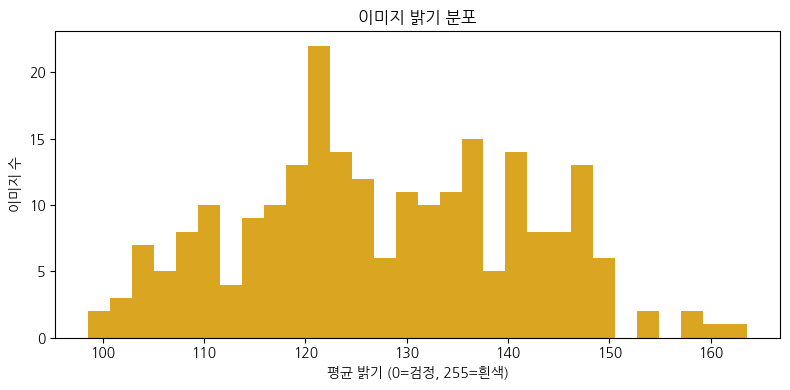

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

brightness_values = []

for fname in merged_by_filename.keys():
    img_path = os.path.join(base, 'train_images', fname)
    img = Image.open(img_path).convert('L')  # 그레이스케일로 변환해 밝기만 추출
    brightness = np.array(img).mean()  # 픽셀 평균값 = 평균 밝기
    brightness_values.append(brightness)

brightness_values = np.array(brightness_values)

print("밝기 통계:")
print(pd.Series(brightness_values).describe())

plt.figure(figsize=(8, 4))
plt.hist(brightness_values, bins=30, color='goldenrod')
plt.xlabel('평균 밝기 (0=검정, 255=흰색)')
plt.ylabel('이미지 수')
plt.title('이미지 밝기 분포')
plt.tight_layout()
plt.show()

In [ ]:
# 평균±2표준편차 벗어나는 이미지 찾기
mean_b, std_b = brightness_values.mean(), brightness_values.std()
outlier_mask = (brightness_values < mean_b - 2*std_b) | (brightness_values > mean_b + 2*std_b)

outlier_files = np.array(list(merged_by_filename.keys()))[outlier_mask]
print("밝기 이상치 이미지 수:", len(outlier_files))
print(outlier_files[:10])

밝기 이상치 이미지 수: 5
['K-003351-036637-041768_0_2_0_2_70_000_200.png'
 'K-001900-016548-024850-029345_0_2_0_2_75_000_200.png'
 'K-002483-019552-022362-025438_0_2_0_2_70_000_200.png'
 'K-002483-003743-012778-013395_0_2_0_2_70_000_200.png'
 'K-002483-012081-012778-025438_0_2_0_2_70_000_200.png']


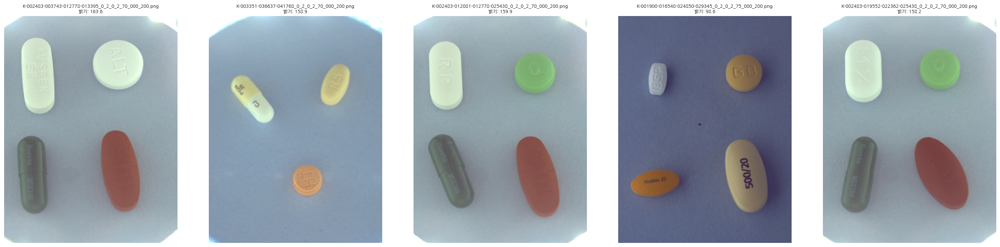

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

outlier_files_list = [
    'K-002483-003743-012778-013395_0_2_0_2_70_000_200.png',
    'K-003351-036637-041768_0_2_0_2_70_000_200.png',
    'K-002483-012081-012778-025438_0_2_0_2_70_000_200.png',
    'K-001900-016548-024850-029345_0_2_0_2_75_000_200.png',
    'K-002483-019552-022362-025438_0_2_0_2_70_000_200.png'
]

fig, axes = plt.subplots(1, 5, figsize=(25, 6))

for ax, fname in zip(axes, outlier_files_list):
    img_path = os.path.join(base, 'train_images', fname)
    img = Image.open(img_path)
    brightness = np.array(img.convert('L')).mean()
    ax.imshow(img)
    ax.set_title(f"{fname}\n밝기: {brightness:.1f}", fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.show()

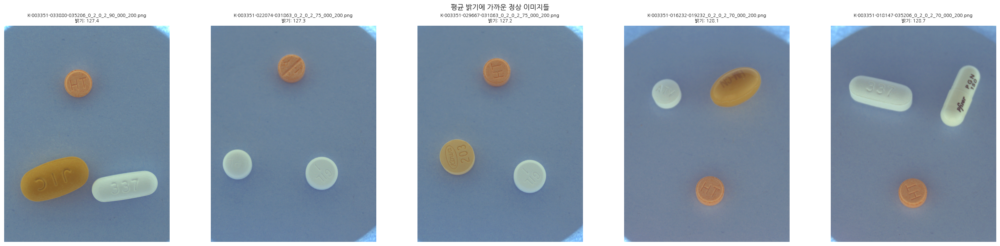

In [ ]:
# 평균(127.65)에 가장 가까운 이미지 5장도 같이 뽑기
normal_idx = np.argsort(np.abs(brightness_values - mean_b))[:5]
normal_files = np.array(list(merged_by_filename.keys()))[normal_idx]

fig, axes = plt.subplots(1, 5, figsize=(25, 6))
for ax, fname in zip(axes, normal_files):
    img_path = os.path.join(base, 'train_images', fname)
    img = Image.open(img_path)
    brightness = np.array(img.convert('L')).mean()
    ax.imshow(img)
    ax.set_title(f"{fname}\n밝기: {brightness:.1f}", fontsize=8)
    ax.axis('off')

plt.suptitle('평균 밝기에 가까운 정상 이미지들')
plt.tight_layout()
plt.show()

- 배경색(연회색)·조명색(주백색) 100% 통일
- 밝기 표준편차 13.8(전체 스케일 255 대비 5.4%) → 변동 폭이 매우 작음
- 통계상 "이상치"로 잡힌 이미지도 실제로는 알약이 뚜렷하게 보임 → 보정이 필요하지 않음

## 12. 선명도 확인
- Laplacian variance로 측정. 이미지에 경계선이 뚜렷할수록 이 값이 크고, 흐릴수록 작아짐. 알약 표면의 각인 글씨가 선명한지와 직결되는 지표
- 초점이 안 맞거나 흔들린 사진이 섞여 있으면, 모델이 각인 문자 같은 미세한 특징을 학습하지 못해 클래스 구분 성능이 떨어질 수 있음. 실제로 문제가 있는지 정량적으로 확인

In [ ]:
import cv2
import numpy as np
import pandas as pd

def laplacian_variance(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    return cv2.Laplacian(img, cv2.CV_64F).var()

sharpness_values = []
file_list = list(merged_by_filename.keys())

for fname in file_list:
    img_path = os.path.join(base, 'train_images', fname)
    sharpness_values.append(laplacian_variance(img_path))

sharpness_values = np.array(sharpness_values)

print("선명도(Laplacian variance) 통계:")
print(pd.Series(sharpness_values).describe())

선명도(Laplacian variance) 통계:
count    232.000000
mean      39.272491
std        6.938889
min       25.201167
25%       34.214030
50%       37.140481
75%       45.608583
max       53.873155
dtype: float64


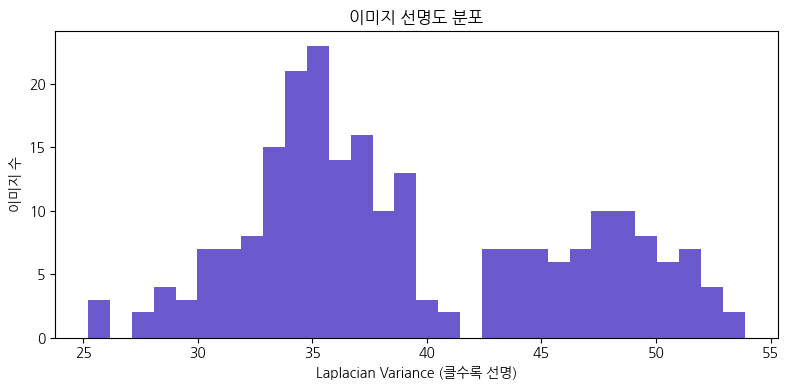

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.hist(sharpness_values, bins=30, color='slateblue')
plt.xlabel('Laplacian Variance (클수록 선명)')
plt.ylabel('이미지 수')
plt.title('이미지 선명도 분포')
plt.tight_layout()
plt.show()

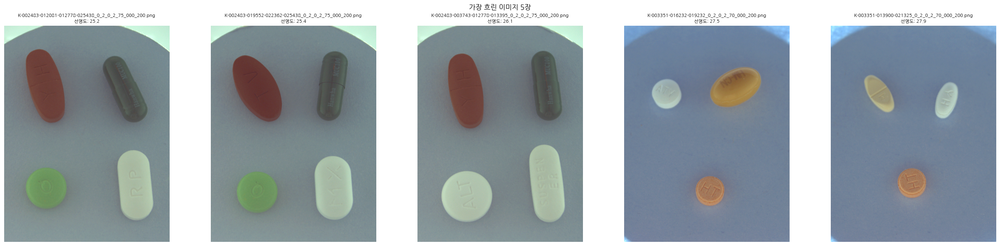

In [ ]:
blurry_idx = np.argsort(sharpness_values)[:5]  # 값이 작은 순 = 가장 흐린 것
blurry_files = np.array(file_list)[blurry_idx]

fig, axes = plt.subplots(1, 5, figsize=(25, 6))
for ax, fname in zip(axes, blurry_files):
    img = Image.open(os.path.join(base, 'train_images', fname))
    sv = sharpness_values[file_list.index(fname)]
    ax.imshow(img)
    ax.set_title(f"{fname}\n선명도: {sv:.1f}", fontsize=8)
    ax.axis('off')
plt.suptitle('가장 흐린 이미지 5장')
plt.tight_layout()
plt.show()

In [ ]:
camera_la_by_file = {fname: entry['image_info']['camera_la'] for fname, entry in merged_by_filename.items()}

df_sharp = pd.DataFrame({
    'file_name': file_list,
    'sharpness': sharpness_values,
    'camera_la': [camera_la_by_file[f] for f in file_list]
})

print(df_sharp.groupby('camera_la')['sharpness'].describe())

           count       mean       std        min        25%        50%  \
camera_la                                                                
70          72.0  34.524290  3.737317  27.517515  32.006608  34.176815   
75          75.0  35.081226  2.845875  25.201167  34.214492  35.541295   
90          85.0  46.992671  4.259913  32.386190  44.835753  47.624732   

                 75%        max  
camera_la                        
70         37.374303  43.547318  
75         36.823463  40.561051  
90         49.756800  53.873155  


- 카메라가 알약에 더 가까운 각도(90도 = 수직 위에서 촬영 추정)일 때는 선명하고, 비스듬한 각도(70/75도)일 때는 상대적으로 흐리게 나온 것으로 보임

### test의 밝기 이상치(너무 어둡거나 밝은 이미지)를 찾아서 실제로 문제가 되는 수준인지 눈으로 확인

In [ ]:
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import glob, os

test_files = glob.glob(os.path.join(base, 'test_images', '*.png'))

test_brightness = []
test_sharpness = []

for f in test_files:
    img = Image.open(f).convert('L')
    arr = np.array(img)
    test_brightness.append(arr.mean())
    test_sharpness.append(cv2.Laplacian(arr, cv2.CV_64F).var())

test_brightness = np.array(test_brightness)
test_sharpness = np.array(test_sharpness)

print("=== test 밝기 통계 ===")
print(pd.Series(test_brightness).describe())

print("\n=== test 선명도 통계 ===")
print(pd.Series(test_sharpness).describe())

=== test 밝기 통계 ===
count    842.000000
mean     120.938752
std       16.729831
min       91.614701
25%      109.567408
50%      116.053466
75%      129.982493
max      163.829935
dtype: float64

=== test 선명도 통계 ===
count    842.000000
mean      39.199461
std        7.094312
min       24.292083
25%       34.510656
50%       38.409712
75%       45.436769
max       53.543448
dtype: float64


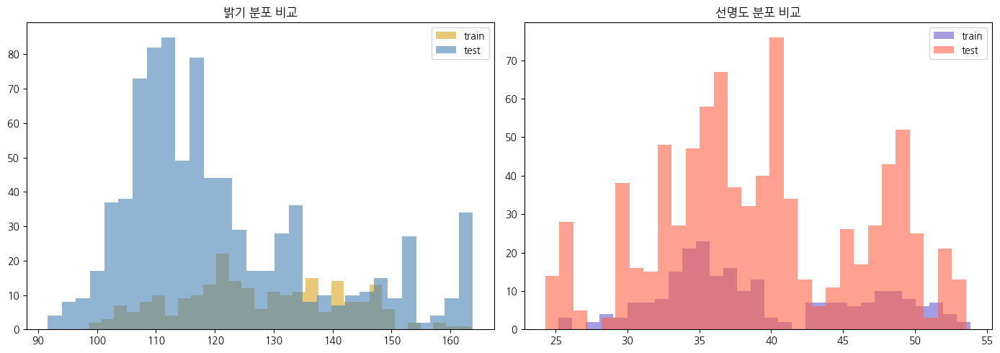

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(brightness_values, bins=30, alpha=0.6, label='train', color='goldenrod')
axes[0].hist(test_brightness, bins=30, alpha=0.6, label='test', color='steelblue')
axes[0].set_title('밝기 분포 비교')
axes[0].legend()

axes[1].hist(sharpness_values, bins=30, alpha=0.6, label='train', color='slateblue')
axes[1].hist(test_sharpness, bins=30, alpha=0.6, label='test', color='tomato')
axes[1].set_title('선명도 분포 비교')
axes[1].legend()

plt.tight_layout()
plt.show()

- test가 train보다 전반적으로 더 다양한 밝기 조건을 포함하고 있음 (더 어두운 이미지도, 더 밝은 이미지도 많음)
- test 데이터가 train보다 더 다양한 조명, 각도 조건을 포함하고 있는 것으로 보임. test가 train보다 더 폭넓은 촬영 조건을 커버하는 구조라는 게 밝기,선명도에서도 드러난 것으로 보임

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# 가장 어두운 5장
darkest_idx = np.argsort(test_brightness)[:5]
# 가장 밝은 5장
brightest_idx = np.argsort(test_brightness)[-5:]

fig, axes = plt.subplots(2, 5, figsize=(25, 10))

for i, idx in enumerate(darkest_idx):
    img = Image.open(test_files[idx])
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"{os.path.basename(test_files[idx])}\n밝기: {test_brightness[idx]:.1f}", fontsize=9)
    axes[0, i].axis('off')

for i, idx in enumerate(brightest_idx):
    img = Image.open(test_files[idx])
    axes[1, i].imshow(img)
    axes[1, i].set_title(f"{os.path.basename(test_files[idx])}\n밝기: {test_brightness[idx]:.1f}", fontsize=9)
    axes[1, i].axis('off')

axes[0, 0].set_ylabel('가장 어두운 5장', fontsize=12)
axes[1, 0].set_ylabel('가장 밝은 5장', fontsize=12)

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

- 어두운 5장 (밝기 91~94)
    - 배경이 보랏빛/청회색 톤으로 보이고, 전체적으로 채도가 낮고 칙칙하게 나오나 각인 글씨는 대부분 읽을수 있는 수준
- 밝은 5장 (밝기 163)
    - 배경이 밝은 청백색이고, train에서 봤던 "정상 연회색 배경"과는 톤이 다름. 알약 자체는 선명하게 잘 보임

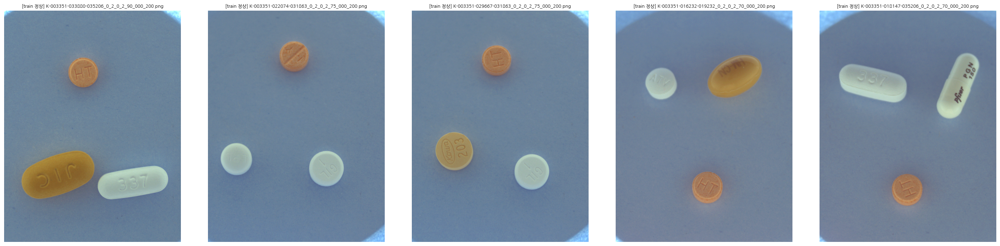

In [ ]:
# train의 평균 밝기 범위에 있는 정상 이미지도 다시 확인 (앞서 만든 normal_files 재사용)
fig, axes = plt.subplots(1, 5, figsize=(25, 6))
for ax, fname in zip(axes, normal_files):
    img_path = os.path.join(base, 'train_images', fname)
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(f"[train 정상] {fname}", fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

- 두 그룹 다 알약 인식에 지장을 줄 정도로 심각하진 않음. 다만, train에서는 배경색이 "연회색 배경" 100% 하나로 통일되어 있었는데, test는 배경 색조(보랏빛 vs 밝은 청백색)가 이미지마다 눈에 띄게 다름. test가 train보다 조명 환경이 더 다양함
- 심한 보정은 필요 없어 보임. 어느 이미지도 알약을 못 알아볼 정도로 손상되진 않았기 때문

## 13. 오버샘플링

- 희귀 클래스가 포함된 이미지를 학습 데이터 안에서 여러 번 복제해서, 모델이 더 자주 보게 만드는 방법

In [ ]:
from collections import Counter
import numpy as np

TARGET_MIN = 9

# 1. class_img_count를 train_files 기준으로 새로 계산
class_img_count = Counter()
for fname in train_files:
    cats = set(ann['category_id'] for ann in merged_by_filename[fname]['annotations'])
    for c in cats:
        class_img_count[c] += 1

# 2. 오버샘플링 수행
oversampled_train_files = list(train_files)

for fname in train_files:
    cats = set(ann['category_id'] for ann in merged_by_filename[fname]['annotations'])
    min_count_in_image = min(class_img_count[c] for c in cats)
    if min_count_in_image < TARGET_MIN:
        repeat = int(np.ceil(TARGET_MIN / min_count_in_image))
        added = [fname] * (repeat - 1)
        oversampled_train_files.extend(added)
        print(f"{fname} -> min_count={min_count_in_image}, repeat={repeat}, 추가된 개수={len(added)}")  # 디버그용 출력

print("\n원본 train 수:", len(train_files))
print("오버샘플링 후 train 수:", len(oversampled_train_files))

# 3. 재검증
new_class_count = Counter()
for fname in oversampled_train_files:
    cats = set(ann['category_id'] for ann in merged_by_filename[fname]['annotations'])
    for c in cats:
        new_class_count[c] += 1

print("\n오버샘플링 후 최소 클래스 등장 횟수:", min(new_class_count.values()))

K-003483-016262-022347-027733_0_2_0_2_70_000_200.png -> min_count=7, repeat=2, 추가된 개수=1
K-003483-016262-022347-027733_0_2_0_2_90_000_200.png -> min_count=7, repeat=2, 추가된 개수=1
K-003483-016262-022347-027733_0_2_0_2_75_000_200.png -> min_count=7, repeat=2, 추가된 개수=1
K-003483-016262-019861-028763_0_2_0_2_75_000_200.png -> min_count=5, repeat=2, 추가된 개수=1
K-003483-016262-019861-028763_0_2_0_2_70_000_200.png -> min_count=5, repeat=2, 추가된 개수=1
K-003483-016262-019861-028763_0_2_0_2_90_000_200.png -> min_count=5, repeat=2, 추가된 개수=1
K-003483-025469-028763-035206_0_2_0_2_90_000_200.png -> min_count=7, repeat=2, 추가된 개수=1
K-003483-025469-028763-035206_0_2_0_2_75_000_200.png -> min_count=7, repeat=2, 추가된 개수=1
K-003483-025469-028763-035206_0_2_0_2_70_000_200.png -> min_count=7, repeat=2, 추가된 개수=1
K-001900-016548-019607-029451_0_2_0_2_75_000_200.png -> min_count=2, repeat=5, 추가된 개수=4
K-001900-016548-019607-029451_0_2_0_2_90_000_200.png -> min_count=2, repeat=5, 추가된 개수=4
K-003351-016688-019232_0_2_0_2_9

## 14. YOLO, Faster R-CNN(ResNet 백본) 모델용 파일 생성

### Faster R-CNN

In [ ]:
# @title json 생성

import json

# 1. 오버샘플링된 파일 리스트 기준으로 최종 images, annotations 재구성
final_train_images = []
final_train_annotations = []

new_img_id_counter = 1
new_ann_id_counter = 1

for fname in oversampled_train_files:
    entry = merged_by_filename[fname]

    # 새 image_id로 이미지 항목 생성 (file_name은 원본 그대로, id만 새로 부여)
    img_info = dict(entry['image_info'])
    img_info['id'] = new_img_id_counter
    final_train_images.append(img_info)

    # 이 이미지에 속한 annotation들을 valid_annotations에서 필터링
    original_img_id = next(im['id'] for im in final_images if im['file_name'] == fname)
    anns_for_this_image = [ann for ann in valid_annotations if ann['image_id'] == original_img_id]

    for ann in anns_for_this_image:
        new_ann = dict(ann)
        new_ann['id'] = new_ann_id_counter
        new_ann['image_id'] = new_img_id_counter
        final_train_annotations.append(new_ann)
        new_ann_id_counter += 1

    new_img_id_counter += 1

print("최종 train 이미지 항목 수 (중복 포함):", len(final_train_images))
print("최종 train annotation 수:", len(final_train_annotations))

최종 train 이미지 항목 수 (중복 포함): 311
최종 train annotation 수: 1104


In [ ]:
# @title COCO JSON 조립 및 저장
train_coco = {
    "images": final_train_images,
    "annotations": final_train_annotations,
    "categories": list(final_categories.values()),
    "type": "instances"
}

os.makedirs('data/coco_annotations', exist_ok=True)
with open('data/coco_annotations/train.json', 'w', encoding='utf-8') as f:
    json.dump(train_coco, f, ensure_ascii=False, indent=2)

print("train.json 저장 완료. 이미지:", len(train_coco['images']), "/ annotation:", len(train_coco['annotations']))

train.json 저장 완료. 이미지: 311 / annotation: 1104


In [ ]:
# @title 검증 — 저장된 파일 다시 읽어서 개수 확인

with open('data/coco_annotations/train.json', 'r', encoding='utf-8') as f:
    check = json.load(f)

print("검증 - 이미지 수:", len(check['images']))
print("검증 - annotation 수:", len(check['annotations']))
print("검증 - category 수:", len(check['categories']))

# 샘플 1개 확인
print("\n샘플 이미지:", check['images'][0])
print("샘플 annotation:", check['annotations'][0])

검증 - 이미지 수: 311
검증 - annotation 수: 1104
검증 - category 수: 56

샘플 이미지: {'file_name': 'K-003351-020014-022074_0_2_0_2_90_000_200.png', 'width': 976, 'height': 1280, 'imgfile': 'K-003351-020014-022074_0_2_0_2_90_000_200.png', 'drug_N': 'K-022074', 'drug_S': '정상알약', 'back_color': '연회색 배경', 'drug_dir': '앞면', 'light_color': '주백색', 'camera_la': 90, 'camera_lo': 0, 'size': 200, 'dl_idx': '22074', 'dl_mapping_code': 'K-022074', 'dl_name': '리피로우정 20mg', 'dl_name_en': 'Lipilow Tab. 20mg', 'img_key': 'http://connectdi.com/design/img/drug/148387985149700089.jpg', 'dl_material': '무수아토르바스타틴칼슘', 'dl_material_en': 'Atorvastatin Calcium Anhydrous', 'dl_custom_shape': '정제, 저작정', 'dl_company': '(주)종근당', 'dl_company_en': 'Chong Kun Dang Pharmaceutical', 'di_company_mf': '', 'di_company_mf_en': '', 'item_seq': 200709390, 'di_item_permit_date': '20070809', 'di_class_no': '[02180]동맥경화용제', 'di_etc_otc_code': '전문의약품', 'di_edi_code': '643300660,A01208211', 'chart': '흰색의 원형 필름코팅정제', 'drug_shape': '원형', 'thick': 4.

In [ ]:
final_val_images = []
final_val_annotations = []

new_img_id_counter = 1
new_ann_id_counter = 1

for fname in val_files:
    entry = merged_by_filename[fname]
    img_info = dict(entry['image_info'])
    img_info['id'] = new_img_id_counter
    final_val_images.append(img_info)

    original_img_id = next(im['id'] for im in final_images if im['file_name'] == fname)
    anns_for_this_image = [ann for ann in valid_annotations if ann['image_id'] == original_img_id]

    for ann in anns_for_this_image:
        new_ann = dict(ann)
        new_ann['id'] = new_ann_id_counter
        new_ann['image_id'] = new_img_id_counter
        final_val_annotations.append(new_ann)
        new_ann_id_counter += 1

    new_img_id_counter += 1

val_coco = {
    "images": final_val_images,
    "annotations": final_val_annotations,
    "categories": list(final_categories.values()),
    "type": "instances"
}

with open('data/coco_annotations/val.json', 'w', encoding='utf-8') as f:
    json.dump(val_coco, f, ensure_ascii=False, indent=2)

print("val.json 저장 완료. 이미지:", len(val_coco['images']), "/ annotation:", len(val_coco['annotations']))

val.json 저장 완료. 이미지: 50 / annotation: 168


- 182(train) + 50(val) = 232로 정확히 일치. train.json, val.json 모두 정상적으로 완성

In [ ]:
import shutil

os.makedirs('data/images/train', exist_ok=True)
os.makedirs('data/images/val', exist_ok=True)
os.makedirs('data/images/test', exist_ok=True)

# train (오버샘플링과 무관하게 원본 파일은 한 번씩만 복사하면 됨 - JSON에서 여러 image_id가 같은 file_name을 참조)
for fname in set(train_files):
    shutil.copy(os.path.join(base, 'train_images', fname), 'data/images/train/')

for fname in val_files:
    shutil.copy(os.path.join(base, 'train_images', fname), 'data/images/val/')

for f in glob.glob(os.path.join(base, 'test_images', '*.png')):
    shutil.copy(f, 'data/images/test/')

print("train 이미지 파일 수:", len(os.listdir('data/images/train')))
print("val 이미지 파일 수:", len(os.listdir('data/images/val')))
print("test 이미지 파일 수:", len(os.listdir('data/images/test')))

train 이미지 파일 수: 182
val 이미지 파일 수: 50
test 이미지 파일 수: 842


- JSON에서 여러 image_id가 같은 file_name을 가리키니까, 실제 파일은 중복 저장할 필요가 없음 (모델 학습 코드가 JSON을 보고 같은 파일을 여러 번 불러오는 방식으로 처리).

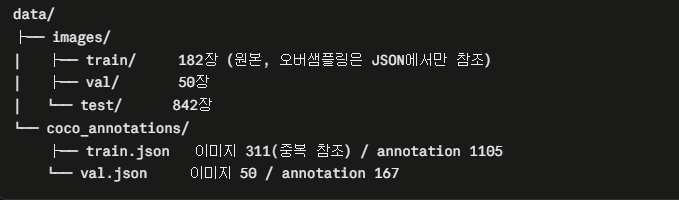

### YOLO



In [ ]:
# 폴더 생성 및 변환
import os

yolo_label_dir_train = 'data/yolo_labels/train'
yolo_label_dir_val = 'data/yolo_labels/val'
os.makedirs(yolo_label_dir_train, exist_ok=True)
os.makedirs(yolo_label_dir_val, exist_ok=True)

def coco_bbox_to_yolo(bbox, img_w, img_h):
    x, y, w, h = bbox
    x_center = (x + w / 2) / img_w
    y_center = (y + h / 2) / img_h
    return x_center, y_center, w / img_w, h / img_h

all_cat_ids_sorted = sorted(final_categories.keys())
cat_id_to_yolo_idx = {cid: i for i, cid in enumerate(all_cat_ids_sorted)}

# train/val 라벨(.txt) 파일 생성 — 오버샘플링 없이, 원본 이미지 기준 1개씩만
def write_yolo_labels(image_list, out_dir):
    for fname in image_list:
        entry = merged_by_filename[fname]
        img_w, img_h = entry['image_info']['width'], entry['image_info']['height']

        original_img_id = next(im['id'] for im in final_images if im['file_name'] == fname)
        anns = [ann for ann in valid_annotations if ann['image_id'] == original_img_id]

        lines = []
        for ann in anns:
            yolo_idx = cat_id_to_yolo_idx[ann['category_id']]
            xc, yc, w, h = coco_bbox_to_yolo(ann['bbox'], img_w, img_h)
            lines.append(f"{yolo_idx} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")

        txt_name = fname.replace('.png', '.txt')
        with open(os.path.join(out_dir, txt_name), 'w') as f:
            f.write('\n'.join(lines))

write_yolo_labels(set(train_files), yolo_label_dir_train)  # 182개 txt
write_yolo_labels(val_files, yolo_label_dir_val)             # 50개 txt

print("train txt 개수:", len(os.listdir(yolo_label_dir_train)))
print("val txt 개수:", len(os.listdir(yolo_label_dir_val)))

train txt 개수: 182
val txt 개수: 50


In [ ]:
# 오버샘플링 반영용 train 이미지 경로 목록(txt) 생성
with open('data/yolo_labels/train_oversampled.txt', 'w') as f:
    for fname in oversampled_train_files:
        f.write(f"./images/train/{fname}\n")

with open('data/yolo_labels/train_oversampled.txt') as f:
    lines = f.readlines()
print("총 줄 수:", len(lines))
print("고유 이미지 수:", len(set(lines)))

총 줄 수: 311
고유 이미지 수: 182


In [ ]:
# data.yaml 생성 — train은 폴더 대신 위 txt 파일 지정
cat_id_to_name_yolo = {cid: cat_id_to_name[cid] for cid in all_cat_ids_sorted}
names_list = [cat_id_to_name_yolo[cid] for cid in all_cat_ids_sorted]

yaml_content = f"""train: ./train_oversampled.txt
val: ../images/val

nc: {len(names_list)}
names: {names_list}
"""

with open('data/yolo_labels/data.yaml', 'w', encoding='utf-8') as f:
    f.write(yaml_content)

print(yaml_content)

train: ./train_oversampled.txt
val: ../images/val

nc: 56
names: ['보령부스파정 5mg', '뮤테란캡슐 100mg', '일양하이트린정 2mg', '기넥신에프정(은행엽엑스)(수출용)', '무코스타정(레바미피드)(비매품)', '알드린정', '뉴로메드정(옥시라세탐)', '에어탈정(아세클로페낙)', '리렉스펜정 300mg/PTP', '아빌리파이정 10mg', '다보타민큐정 10mg/병', '써스펜8시간이알서방정 650mg', '에빅사정(메만틴염산염)(비매품)', '리피토정 20mg', '크레스토정 20mg', '가바토파정 100mg', '동아가바펜틴정 800mg', '오마코연질캡슐(오메가-3-산에틸에스테르90)', '리리카캡슐 150mg', '종근당글리아티린연질캡슐(콜린알포세레이트)\xa0', '콜리네이트연질캡슐 400mg', '트루비타정 60mg/병', '스토가정 10mg', '노바스크정 5mg', '마도파정', '플라빅스정 75mg', '엑스포지정 5/160mg', '아토르바정 10mg', '라비에트정 20mg', '리피로우정 20mg', '자누비아정 50mg', '맥시부펜이알정 300mg', '놀텍정 10mg', '자누메트정 50/850mg', '큐시드정 31.5mg/PTP', '아모잘탄정 5/100mg', '트윈스타정 40/5mg', '카나브정 60mg', '울트라셋이알서방정', '졸로푸트정 100mg', '트라젠타정(리나글립틴)', '비모보정 500/20mg', '레일라정', '리바로정 4mg', '트라젠타듀오정 2.5/850mg', '아질렉트정(라사길린메실산염)', '자누메트엑스알서방정 100/1000mg', '글리아타민연질캡슐', '신바로정', '에스원엠프정 20mg', '글리틴정(콜린알포세레이트)', '제미메트서방정 50/1000mg', '아토젯정 10/40mg', '로수젯정10/5밀리그램', '로수바미브정 10/20mg', '카발린캡슐 25mg']



In [ ]:
# classes.txt 생성 (COCO/YOLO 버전 둘 다)
with open('data/classes_coco.txt', 'w', encoding='utf-8') as f:
    for cid in sorted(final_categories.keys()):
        f.write(f"{cid}: {cat_id_to_name[cid]}\n")

with open('data/yolo_labels/classes.txt', 'w', encoding='utf-8') as f:
    for cid in all_cat_ids_sorted:
        f.write(f"{cat_id_to_name[cid]}\n")

print("classes 파일 생성 완료")

classes 파일 생성 완료


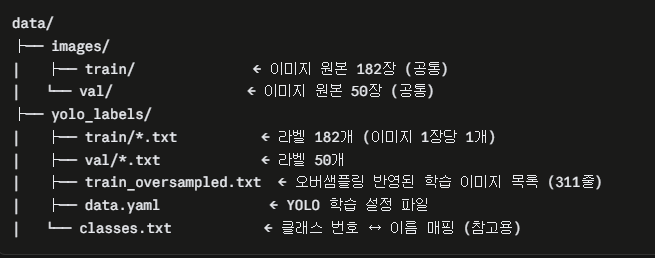

## 15. 참고

객체 검출(Object Detection) 프로젝트 추천 모델
- VGGNet/ResNet?
    - 백본(backbone)으로 사용: YOLO, Faster R-CNN 같은 검출 모델은 내부적으로 이미지의 특징을 뽑아내는 부분이 필요한데, 이때 ResNet 같은 분류 모델의 구조를 "특징 추출기"로 재활용함. 즉 ResNet 단독이 아니라 ResNet 백본 + 검출 head(YOLO나 Faster R-CNN 구조) 조합으로 씀.

추천 방향
| 모델 | 특징 | 비고 |
|---|---|---|
| YOLO 계열 | 빠르고 실무에서 많이 씀, 단일 이미지 다중 객체 검출에 최적화 | 메인으로 사용 |
| Faster R-CNN(ResNet 백본) | YOLO보다 느리지만 정확도 높은 경우 많음 | 비교 실험용으로 사용 |

담당자별 전달 포맷
| 담당자 | 필요 포맷 | 이유 |
|---|---|---|
| Faster R-CNN(ResNet 백본) 담당 | COCO JSON 그대로 전달 | 대부분 COCO JSON을 표준 입력으로 받으므로 따로 변환 불필요 |
| YOLO 담당 | YOLO txt 포맷 | 이미지당 `.txt` 파일 하나, 한 줄에 `class_id x_center y_center width height` (모두 0~1 정규화)